# Data Exploration using Scanpy

### Setup

In [2]:
import scanpy as sc
import numpy as np
import seaborn as sns
import anndata
import scvi
import os
import pandas as pd
os.environ["CUDA_VISIBLE_DEVICES"]="1"
DATA_PATH = "/media/gambino/students_workdir/ibp/combined_filtered_counts_13_11.h5"
NORMALIZED_SAMPLES_DATA_PATH = "/media/gambino/students_workdir/ibp/combined_normalizedpersample_qced_filtered_counts_13_11.h5"
NORMALIZED_SAMPLES_GLOBAL_DATA_PATH = "/media/gambino/students_workdir/ibp/combined_normalizedpersampleglobal_qced_filtered_counts_13_11.h5"
NORMALIZED_GLOBAL_DATA_PATH = "/media/gambino/students_workdir/ibp/combined_normalizedglobal_qced_filtered_counts_13_11.h5"

sc.settings.verbosity = 3
sc.logging.print_versions()

-----
anndata     0.10.3
scanpy      1.9.6
-----
Cython                      3.0.5
PIL                         10.1.0
absl                        NA
aiohttp                     3.9.0
aiosignal                   1.3.1
annotated_types             0.6.0
anyio                       NA
arrow                       1.3.0
asttokens                   NA
async_timeout               4.0.3
attr                        23.1.0
attrs                       23.1.0
babel                       2.13.1
backoff                     2.2.1
brotli                      1.0.9
bs4                         4.12.2
certifi                     2023.11.17
cffi                        1.15.1
charset_normalizer          2.0.4
chex                        0.1.7
click                       8.1.7
comm                        0.2.0
contextlib2                 NA
croniter                    NA
cycler                      0.12.1
cython                      3.0.5
cython_runtime              NA
dateutil                    2.8.2
debug

## Loading Data

In [13]:
adata = anndata.read("/media/gambino/students_workdir/ibp/combined_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")
adata.X=adata.layers["log1p_norm"]
adata

AnnData object with n_obs × n_vars = 125326 × 36601
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'predicted_doublets', 'doublet_scores', 'leiden', 'leiden_0.1', 'leiden_0.3', 'leiden_0.6', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'str_predicted_doublets'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.3_colors', 'leiden_0.6_colors', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2.5_colors', 'leiden_2_colors', 'leiden_3_colors', 'leiden_colors', 'neighbors', 'pca', 'str_predicted_doublets_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p_norm', 'raw_counts'
    obsp: 'connectivities', 'distances'

### Marker genes

Now that we cleaned up our single cell data, we can start computing marker genes for clusters to help us understand their characteristics. This is also useful for annotating them for example as different cell types. Marker genes are computed with `sc.tl.rank_genes_groups`. The second argument specifies the clustering or annotation for which we compute. Here we use the Leiden clustering with resolution 0.3 `leiden_0.3`. We also specify the key for storing the clustering `key_added`. SCANPY offer different ways for computing marker genes. Per default we collect all cells from one cluster and compare them against all other cells. Methods for detecting marker genes are:
- `t-test`: t-test
- `wilcoxon`: Wilcoxon-ranksum test. This test usually works well on single cell data
- `logreg`: logistic regression (computational more demanding)
For more details see: 
https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html

`sc.pl.rank_genes_groups` can be used for plotting the top marker genes per cluster. 

ranking genes


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_leiden_0.3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:06:11)


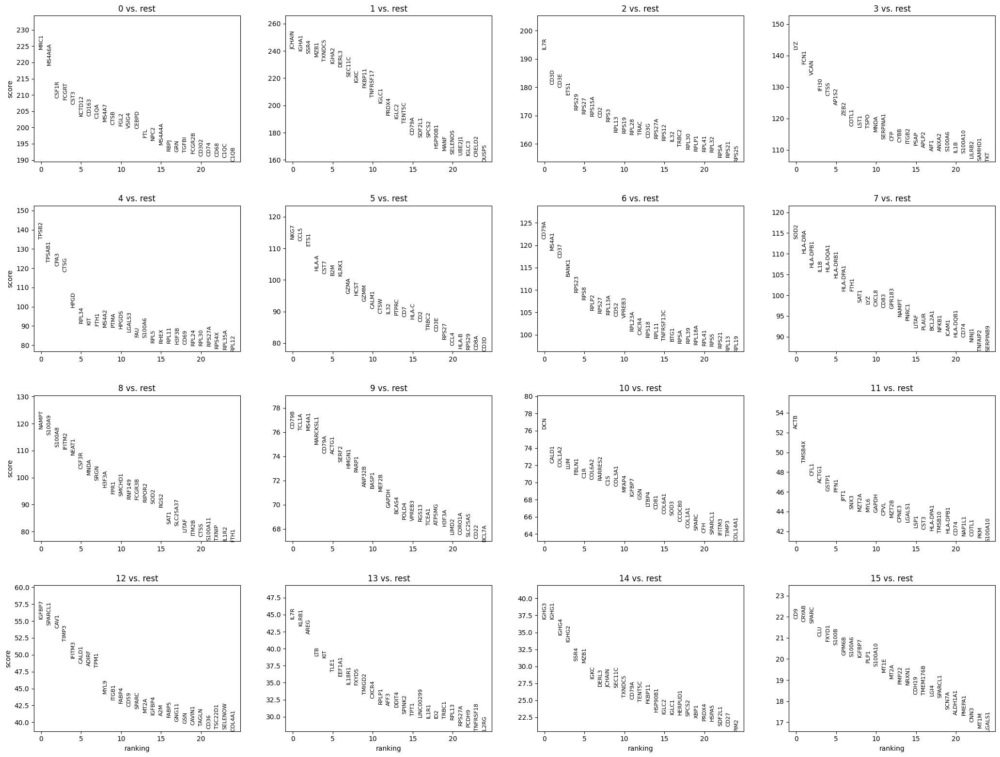

In [14]:
sc.tl.rank_genes_groups(adata, 'leiden_0.3', method='wilcoxon', key_added='rank_leiden_0.3')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='rank_leiden_0.3')

A simple way to obtain the marker genes of a cluster as a pandas data frame is `sc.get.rank_genes_groups_df`

In [16]:
df_ranked_genes = sc.get.rank_genes_groups_df(adata, '0', key='rank_leiden_0.3')
outf = "/media/gambino/students_workdir/ibp/marker_cluster0_rank_leiden_0.3.tsv"
df_ranked_genes.to_csv(outf, sep="\t", index=None)
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,MRC1,224.013870,4.753944,0.0,0.0
1,MS4A6A,219.086044,4.110417,0.0,0.0
2,CSF1R,208.908936,4.015397,0.0,0.0
3,FCGRT,208.606339,3.331971,0.0,0.0
4,CST3,207.033508,4.202624,0.0,0.0
...,...,...,...,...,...
36596,JCHAIN,-110.050209,-7.691714,0.0,0.0
36597,CD48,-117.808098,-2.014806,0.0,0.0
36598,IGHA1,-120.756149,-6.828445,0.0,0.0
36599,ISG20,-125.481346,-2.656526,0.0,0.0


Let's check the expression of the top marker genes on the UMAP

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


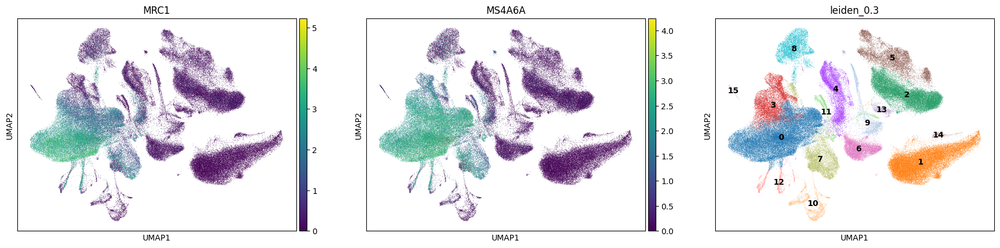

In [18]:
sc.pl.umap(adata, color=['MRC1', 'MS4A6A', 'leiden_0.3'], legend_loc='on data')

For a more strict filtering of marker genes, we can use `sc.tl.filter_rank_genes_groups`. Here `min_in_group_fraction` specifies a threshold for the fraction of cells that express the marker in the cluster and `max_out_group_fraction` outside of the clusters. We can also set an additional threshold for the log-fold change here `min_fold_change`.

In [19]:
# sparsity
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    min_fold_change=2,
    key="rank_leiden_0.3",
    key_added="rank_leiden_0.3_filtered",
)


Filtering genes using: min_in_group_fraction: 0.25 min_fold_change: 2, max_out_group_fraction: 0.5


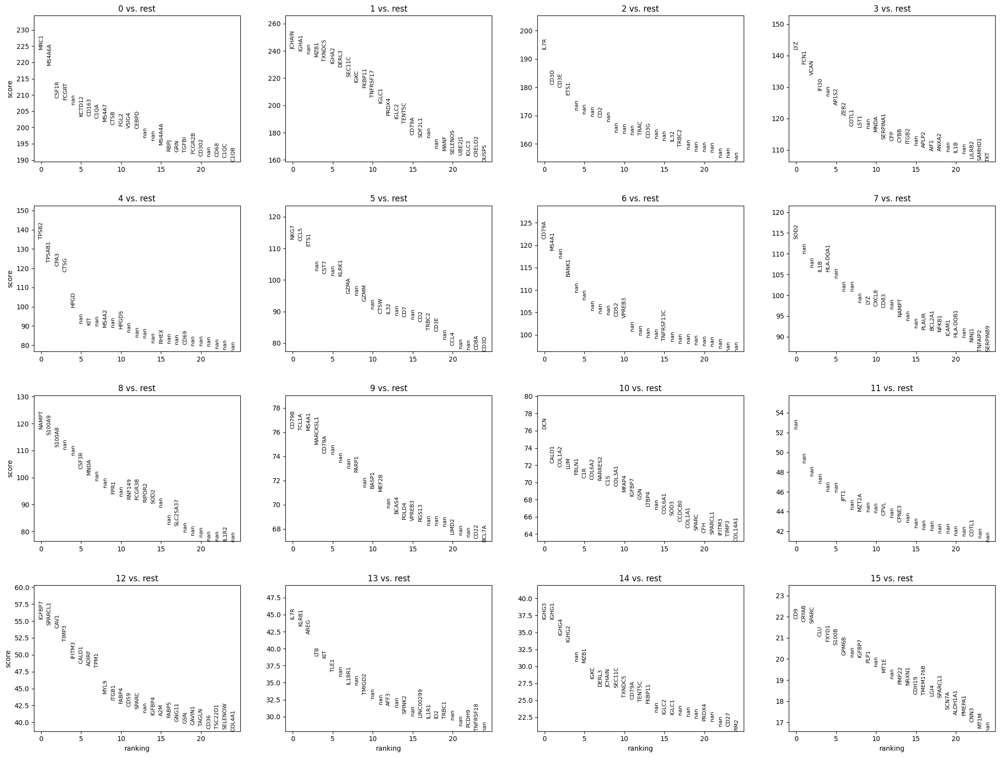

In [20]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key='rank_leiden_0.3_filtered')

As quick way to obtain insights into biological processes, SCANPY offers a wrapper `sc.queries.enrich` for gprofiler (https://biit.cs.ut.ee/gprofiler/gost). Here, we give it a set of genes and specify the species we are looking at: `mmusculus` for mouse and `hsapiens` for human.

In [22]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(adata, '0', key='rank_leiden_0.3_filtered', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0031982,vesicle,6.390862e-39,True,"""Any small, fluid-filled, spherical organelle ...",3976,392,186,22090,0.474490,0.046781,query_1,[GO:0043227]
1,GO:CC,GO:0031410,cytoplasmic vesicle,3.072347e-34,True,"""A vesicle found in the cytoplasm of a cell."" ...",2476,392,138,22090,0.352041,0.055735,query_1,"[GO:0005737, GO:0097708]"
2,GO:CC,GO:0097708,intracellular vesicle,3.835583e-34,True,"""Any vesicle that is part of the intracellular...",2481,392,138,22090,0.352041,0.055623,query_1,"[GO:0031982, GO:0043231]"
3,GO:CC,GO:0071944,cell periphery,8.923713e-28,True,"""The broad region around and including the pla...",6202,392,217,22090,0.553571,0.034989,query_1,[GO:0110165]
4,GO:CC,GO:0005886,plasma membrane,7.290160e-26,True,"""The membrane surrounding a cell that separate...",5717,392,203,22090,0.517857,0.035508,query_1,"[GO:0016020, GO:0071944]"
5,GO:BP,GO:0050896,response to stimulus,6.205015e-25,True,"""Any process that results in a change in state...",8955,383,269,21010,0.702350,0.030039,query_1,[GO:0008150]
6,GO:BP,GO:0006952,defense response,5.182696e-22,True,"""Reactions, triggered in response to the prese...",1769,383,100,21010,0.261097,0.056529,query_1,[GO:0006950]
7,GO:BP,GO:0051239,regulation of multicellular organismal process,7.338737e-22,True,"""Any process that modulates the frequency, rat...",2968,383,134,21010,0.349869,0.045148,query_1,"[GO:0032501, GO:0050789]"
8,GO:BP,GO:0002376,immune system process,1.561180e-21,True,"""Any process involved in the development or fu...",2730,383,127,21010,0.331593,0.046520,query_1,[GO:0008150]
9,GO:BP,GO:0098657,import into cell,3.614493e-20,True,"""The directed movement of some substance from ...",939,383,69,21010,0.180157,0.073482,query_1,[GO:0006810]


In [23]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(adata, '1', key='rank_leiden_0.3_filtered', 
                                                  log2fc_min=1, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0071745,IgA immunoglobulin complex,1.994785e-07,True,"""A protein complex composed of two identical i...",6,61,4,22090,0.065574,0.666667,query_1,[GO:0019814]
1,GO:CC,GO:0071750,dimeric IgA immunoglobulin complex,5.085208e-06,True,"""A protein complex composed of two monomeric I...",3,61,3,22090,0.049180,1.000000,query_1,[GO:0071749]
2,GO:CC,GO:0071752,secretory dimeric IgA immunoglobulin complex,5.085208e-06,True,"""A dimeric form of secretory IgA immunoglobuli...",3,61,3,22090,0.049180,1.000000,query_1,"[GO:0071750, GO:0071751]"
3,GO:CC,GO:0071748,monomeric IgA immunoglobulin complex,2.030077e-05,True,"""A protein complex composed of two identical i...",4,61,3,22090,0.049180,0.750000,query_1,[GO:0071746]
4,HPA,HPA:0401333,rectum; mucosal lymphoid cells[High],4.628328e-05,True,rectum; mucosal lymphoid cells[High],176,41,8,11006,0.195122,0.045455,query_1,[HPA:0401332]
5,GO:CC,GO:0071746,"IgA immunoglobulin complex, circulating",5.065198e-05,True,"""A protein complex composed of two identical i...",5,61,3,22090,0.049180,0.600000,query_1,"[GO:0042571, GO:0071745]"
6,GO:CC,GO:0071749,polymeric IgA immunoglobulin complex,5.065198e-05,True,"""A protein complex composed of two, three, or ...",5,61,3,22090,0.049180,0.600000,query_1,[GO:0071746]
7,GO:CC,GO:0071751,secretory IgA immunoglobulin complex,5.065198e-05,True,"""A polymeric IgA immunoglobulin complex that i...",5,61,3,22090,0.049180,0.600000,query_1,[GO:0071749]
8,GO:CC,GO:0042571,"immunoglobulin complex, circulating",1.011045e-04,True,"""An immunoglobulin complex that is secreted in...",6,61,3,22090,0.049180,0.500000,query_1,"[GO:0005615, GO:0019814]"
9,GO:CC,GO:0012505,endomembrane system,1.035124e-04,True,"""A collection of membranous structures involve...",4742,61,31,22090,0.508197,0.006537,query_1,[GO:0110165]


For more specific comparisons, we can specify the foreground clusters `groups` to be tested and the background clusters as `ref`. For example, for a pair-wise test betwenn cluster `7` and cluster `6`:

In [25]:
sc.tl.rank_genes_groups(adata, 'leiden_0.3', groups=[7], ref=[6], method='wilcoxon', 
                        key_added='rank_selgroups_leiden_0.3')

ranking genes


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_selgroups_leiden_0.3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:26)


In [27]:
df_rank_cur_cluster=sc.get.rank_genes_groups_df(adata, '7', key='rank_selgroups_leiden_0.3', 
                                                  log2fc_min=1, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:0002376,immune system process,3.337095e-66,True,"""Any process involved in the development or fu...",2730,875,313,21010,0.357714,0.114652,query_1,[GO:0008150]
1,GO:BP,GO:0006952,defense response,1.571735e-54,True,"""Reactions, triggered in response to the prese...",1769,875,229,21010,0.261714,0.129452,query_1,[GO:0006950]
2,GO:BP,GO:0050896,response to stimulus,5.582179e-54,True,"""Any process that results in a change in state...",8955,875,602,21010,0.688000,0.067225,query_1,[GO:0008150]
3,GO:BP,GO:0006955,immune response,2.191605e-53,True,"""Any immune system process that functions in t...",1951,875,240,21010,0.274286,0.123014,query_1,"[GO:0002376, GO:0050896]"
4,GO:BP,GO:0002682,regulation of immune system process,2.464398e-53,True,"""Any process that modulates the frequency, rat...",1482,875,206,21010,0.235429,0.139001,query_1,"[GO:0002376, GO:0050789]"
5,GO:BP,GO:0006954,inflammatory response,1.261580e-50,True,"""The immediate defensive reaction (by vertebra...",824,875,148,21010,0.169143,0.179612,query_1,[GO:0006952]
6,GO:BP,GO:0051239,regulation of multicellular organismal process,3.950581e-48,True,"""Any process that modulates the frequency, rat...",2968,875,296,21010,0.338286,0.099730,query_1,"[GO:0032501, GO:0050789]"
7,GO:BP,GO:0048583,regulation of response to stimulus,1.417859e-47,True,"""Any process that modulates the frequency, rat...",3909,875,349,21010,0.398857,0.089281,query_1,"[GO:0050789, GO:0050896]"
8,GO:BP,GO:0002684,positive regulation of immune system process,7.142772e-47,True,"""Any process that activates or increases the f...",1033,875,161,21010,0.184000,0.155857,query_1,"[GO:0002376, GO:0002682, GO:0048518]"
9,GO:BP,GO:0006950,response to stress,4.119552e-46,True,"""Any process that results in a change in state...",3909,875,346,21010,0.395429,0.088514,query_1,[GO:0050896]


In [30]:
adata

AnnData object with n_obs × n_vars = 125326 × 36601
    obs: 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'predicted_doublets', 'doublet_scores', 'leiden', 'leiden_0.1', 'leiden_0.3', 'leiden_0.6', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'str_predicted_doublets'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_0.1_colors', 'leiden_0.3_colors', 'leiden_0.6_colors', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2.5_colors', 'leiden_2_colors', 'leiden_3_colors', 'leiden_colors', 'neighbors', 'pca', 'str_predicted_doublets_colors', 'umap', 'rank_leiden_0.3', 'rank_leiden_0.3_filtered', 'rank_selgroups_leiden_0.3'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'log1p_norm', 'raw_

In [31]:
uns_1 = adata.uns['rank_leiden_0.3_filtered']
uns_2 = adata.uns["rank_selgroups_leiden_0.3"]
uns_3=adata.uns["rank_leiden_0.3"]
adata.uns['rank_leiden_0.3_filtered']= {key: str(value) for key, value in uns_1.items()}
adata.uns["rank_selgroups_leiden_0.3"]= {key: str(value) for key, value in uns_2.items()}
adata.uns["rank_leiden_0.3"]= {key: str(value) for key, value in uns_3.items()}

In [33]:
adata.write("/media/gambino/students_workdir/ibp/combined_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")

### Annotating celltypes
Distinct clusters in single cell data usually corresponds to cell types, subclasses of cell types, or, cell states depending on the clustering resolution.

Annotating cell types in single cell data usually requires knowledge of cell type specific marker genes or comparison to related already annotated data sets.

If related annotated data sets exist, automated annotation tools can be useful, for example:
- ingest: https://scanpy-tutorials.readthedocs.io/en/latest/integrating-data-using-ingest.html
- scanvi (should be run on a GPU): https://docs.scvi-tools.org/en/stable/user_guide/models/scanvi.html

However, it is still important to manually verify the expression of key marker genes which usually involves literature research or knowledge of marker genes. Here, we will briefly outline the old-fashioned way for annotating single cell clusters

For cluster `0`, we already know from gene enrichment analysis that likely corresponds to a celltype involved in mylenation of axons. In addition, the top marker gene of cluster `0` is `Plp1` a known marker gene for oligodendrocytes.

For non-neuronal cell types, we know following marker genes:
- `Plp1`: oligodendrocytes
- `Aqp4`: astrocytes
- `Csfr1`: microglia 
- `Flt1`: also known as VEGFR-1 vascular endothelial celltypes

For less simple cases, especially when looking at subclasses, combinations of expressed genes and the absence of the expression of specific genes is often useful for annotating them.

In [ ]:
sc.pl.umap(adata, color=['Plp1', 'Aqp4', 'Csf1r', 'Flt1'], cmap='inferno', legend_loc='on data')

In [ ]:
sc.pl.umap(adata, color=['leiden_0.3'], legend_loc='on data')

We can store these cell type mappings in dictionary:

In [ ]:
dict_annotate_clusters = {
    '0': 'oligodendrocyte',
    '5': 'astrocyte',
    '6': 'microglia',
    '18': 'vascular'
}

This dictionary can then be used to add an annotation as `.obs` entry. Clusters which we didn't annotate yet, we simply call `unknown_cluster` + the cluster ID:

In [ ]:
[ cluster for cluster in adata.obs['leiden_0.3']]

In [ ]:
adata.obs['celltype'] = [ dict_annotate_clusters[cluster] if cluster in dict_annotate_clusters.keys()
                        else 'unknown_cluster' + cluster
                        for cluster in adata.obs['leiden_0.3'] ]

In [ ]:
dict_annotate_clusters['0']

In [ ]:
sc.pl.umap(adata, color=['celltype'], legend_loc='on data')

### Annotating celltypes Using Celltypist

In [34]:
from celltypist import models
import celltypist
models.download_models(
    force_update=True, model=["Cells_Intestinal_Tract.pkl","Immune_All_Low.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json


📚 Total models in list: 44
📂 Storing models in /home/anis/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Cells_Intestinal_Tract.pkl


In [35]:
model_gut = models.Model.load(model="Cells_Intestinal_Tract.pkl")
model_high = models.Model.load(model="Immune_All_Low.pkl")

In [36]:
model_high.cell_types,model_gut.cell_types

(array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
        'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
        'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
        'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
        'Cycling T cells', 'Cycling gamma-delta T cells',
        'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
        'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
        'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
        'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
        'Erythrophagocytic macrophages', 'Fibroblasts',
        'Follicular B cells', 'Follicular helper T cells', 'GMP',
        'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
        'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
        'Intermediate macrophages', 'Intestinal macrophages',
        'Kidney-resident macrophages', 'Kupffer cells',
        '

In [37]:
adata_celltypist = adata.copy()
adata_celltypist.X=adata_celltypist.layers["raw_counts"] 
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)
adata_celltypist.X = adata_celltypist.X.toarray()

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [38]:
adata_celltypist.obs_names_make_unique()
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True)
predictions_high_adata = predictions_high.to_adata()
adata.obs["celltypist_cell_label_immune"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_immune"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

🔬 Input data has 125326 cells and 36601 genes
🔗 Matching reference genes in the model


🧬 6147 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25


running Leiden clustering
    finished: found 365 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:03:47)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [48]:
adata.obs['celltypist_cell_label_immune'].value_counts().nlargest(10)

celltypist_cell_label_immune
Plasma cells                 25257
Intestinal macrophages       23073
Classical monocytes          13071
Mast cells                    7377
DC2                           7065
Tcm/Naive helper T cells      6584
Type 1 helper T cells         5532
DC                            5373
Memory B cells                4760
Tem/Trm cytotoxic T cells     4557
Name: count, dtype: int64

In [42]:
adata.write("/media/gambino/students_workdir/ibp/celltypistannotatedimmune_combined_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")

In [43]:
predictions_gut = celltypist.annotate(
    adata_celltypist, model=model_gut, majority_voting=True
)
predictions_gut_adata=predictions_gut.to_adata()
adata.obs["celltypist_cell_label_gut"] = predictions_gut_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_gut"] = predictions_gut_adata.obs.loc[
    adata.obs.index, "conf_score"
]

🔬 Input data has 125326 cells and 36601 genes
🔗 Matching reference genes in the model


🧬 6385 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 25


running Leiden clustering
    finished: found 365 clusters and added
    'over_clustering', the cluster labels (adata.obs, categorical) (0:03:52)


🗳️ Majority voting the predictions
✅ Majority voting done!


In [44]:
adata.obs['celltypist_cell_label_gut'].value_counts().nlargest(10)

celltypist_cell_label_gut
LYVE1+ Macrophage    36095
IgA plasma cell      24689
Activated CD4 T      12599
Monocytes            11819
Mast cell             6889
SELL+ CD4 T           5650
Memory B              4760
CD8 Tmem              3739
Macrophages           2662
NK cell               2041
Name: count, dtype: int64

In [45]:
adata.write("/media/gambino/students_workdir/ibp/celltypistannotatedimmunegut_combined_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")

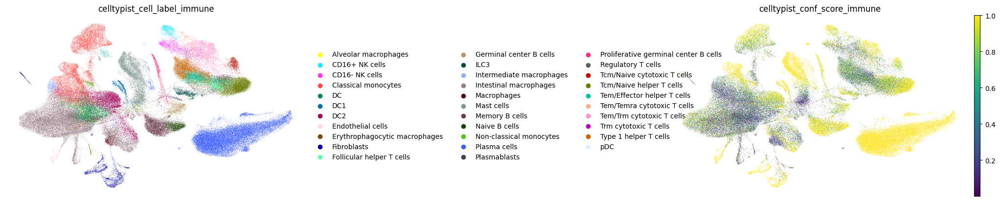

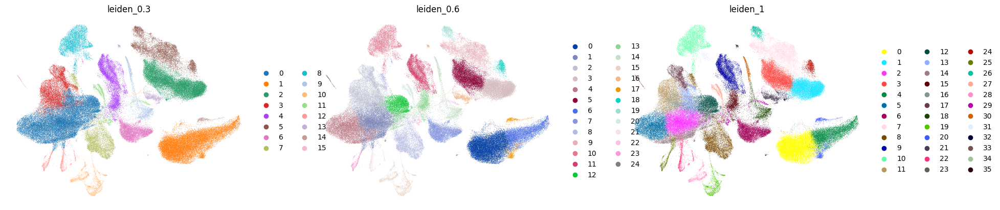

In [56]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_immune", "celltypist_conf_score_immune"],
    frameon=False,
    sort_order=False,
    wspace=1,
)
sc.pl.umap(
    adata,
    color=["leiden_0.3","leiden_0.6","leiden_1"],
    frameon=False,
    sort_order=False,
)

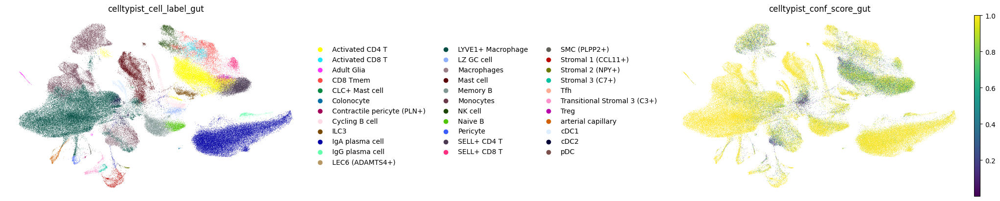

In [50]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_gut", "celltypist_conf_score_gut"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

### Exploring Macrophage Clusters

In [68]:
import anndata
adata=anndata.read("/media/gambino/students_workdir/ibp/celltypistannotatedimmunegut_combined_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")

macrophages_adata=adata[adata.obs['celltypist_cell_label_immune'].apply(lambda x: "Intestinal macrophages" in x or "Intermediate macrophages" in x )].copy()

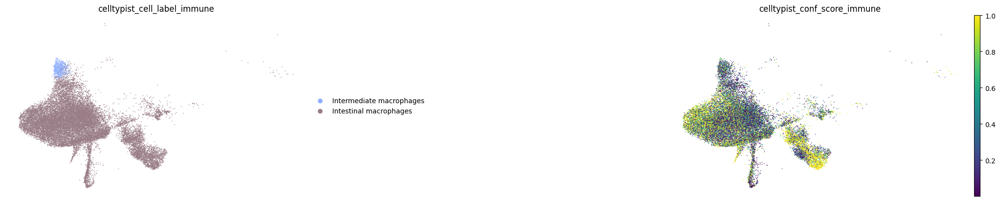

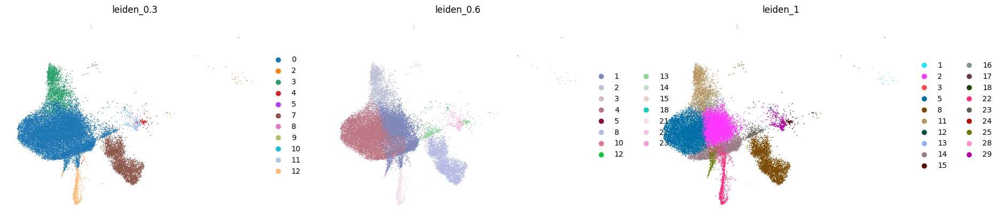

In [75]:
sc.pl.umap(
    macrophages_adata,
    color=["celltypist_cell_label_immune", "celltypist_conf_score_immune"],
    frameon=False,
    sort_order=False,
    wspace=1,
)
sc.pl.umap(
    macrophages_adata,
    color=["leiden_0.3", "leiden_0.6","leiden_1"],
    frameon=False,
    sort_order=False,
)


In [112]:
def filter_value_counts(adata, column_name, min_count=20):
    column_counts = adata.obs[column_name].value_counts()
    valid_categories = column_counts[column_counts >= min_count].index
    filtered_adata = adata[adata.obs[column_name].isin(valid_categories), :].copy()

    print(f"Original {column_name} Value Counts:")
    print(column_counts)
    print(f"\nFiltered {column_name} Value Counts:")
    print(filtered_adata.obs[column_name].value_counts())
    return filtered_adata


macrophages_adata_filtered_small = filter_value_counts(
    adata=macrophages_adata,
    column_name="leiden_0.3",
    min_count=100
)


Original leiden_0.3 Value Counts:
leiden_0.3
0     17038
7      3246
3      2277
12      665
11      363
4       100
2        23
9        13
8         2
5         1
10        1
Name: count, dtype: int64

Filtered leiden_0.3 Value Counts:
leiden_0.3
0     17038
7      3246
3      2277
12      665
11      363
4       100
Name: count, dtype: int64


In [114]:
macrophages_adata_filtered_medium = filter_value_counts(
    adata=macrophages_adata,
    column_name="leiden_0.6",
    min_count=100
)

Original leiden_0.6 Value Counts:
leiden_0.6
4     9779
1     6944
8     3250
2     2345
21     615
22     366
13     356
3       19
23      19
12      18
14      13
10       2
5        1
15       1
18       1
Name: count, dtype: int64

Filtered leiden_0.6 Value Counts:
leiden_0.6
4     9779
1     6944
8     3250
2     2345
21     615
22     366
13     356
Name: count, dtype: int64


In [113]:
macrophages_adata_filtered_large = filter_value_counts(
    adata=macrophages_adata,
    column_name="leiden_1",
    min_count=100
)


Original leiden_1 Value Counts:
leiden_1
5     7102
2     5667
8     3247
14    2847
11    1941
22    1071
16     668
25     371
29     365
23     260
15      99
13      36
12      19
1       19
18      13
17       1
24       1
3        1
28       1
Name: count, dtype: int64

Filtered leiden_1 Value Counts:
leiden_1
5     7102
2     5667
8     3247
14    2847
11    1941
22    1071
16     668
25     371
29     365
23     260
Name: count, dtype: int64


ranking genes
    finished: added to `.uns['m_rank_leiden_0.3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:32)


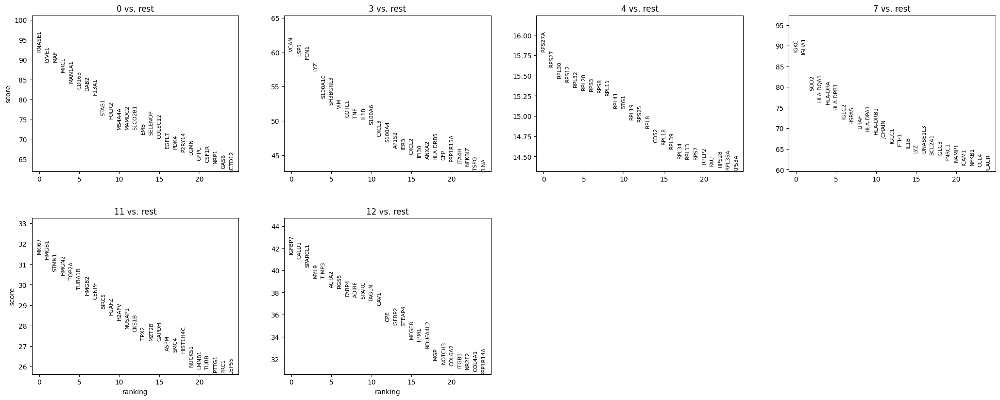

In [115]:
sc.tl.rank_genes_groups(macrophages_adata_filtered_small, 'leiden_0.3', method='wilcoxon', key_added='m_rank_leiden_0.3')
sc.pl.rank_genes_groups(macrophages_adata_filtered_small, n_genes=25, sharey=False, key='m_rank_leiden_0.3')

In [116]:
df_ranked_genes = sc.get.rank_genes_groups_df(macrophages_adata_filtered_small, '0', key='m_rank_leiden_0.3')
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,RNASE1,92.082932,3.076671,0.0,0.0
1,LYVE1,89.504463,3.152591,0.0,0.0
2,MAF,89.468216,2.671828,0.0,0.0
3,MRC1,86.901505,1.890795,0.0,0.0
4,MAN1A1,84.197594,2.515316,0.0,0.0
...,...,...,...,...,...
36596,HLA-DRA,-70.461784,-1.478672,0.0,0.0
36597,BCL2A1,-70.828743,-3.381751,0.0,0.0
36598,HLA-DQA1,-77.049072,-2.323112,0.0,0.0
36599,IL1B,-77.718849,-3.856038,0.0,0.0


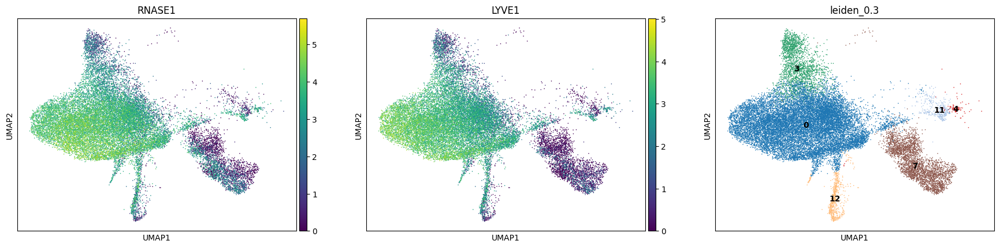

In [117]:
sc.pl.umap(macrophages_adata_filtered_small, color=['RNASE1', 'LYVE1', 'leiden_0.3'], legend_loc='on data')

Filtering genes using: min_in_group_fraction: 0.25 min_fold_change: 2, max_out_group_fraction: 0.5


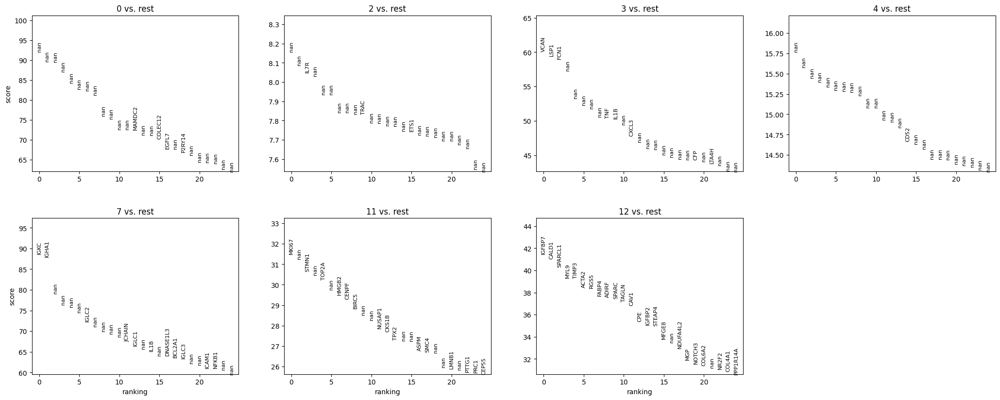

In [101]:
sc.tl.filter_rank_genes_groups(
    macrophages_adata_filtered_small,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    min_fold_change=2,
    key="m_rank_leiden_0.3",
    key_added="m_rank_leiden_0.3_filtered",
)
sc.pl.rank_genes_groups(macrophages_adata_filtered_small, n_genes=25, sharey=False, key='m_rank_leiden_0.3_filtered')

In [ ]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(macrophages_adata_filtered_small, '0', key='m_rank_leiden_0.3', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

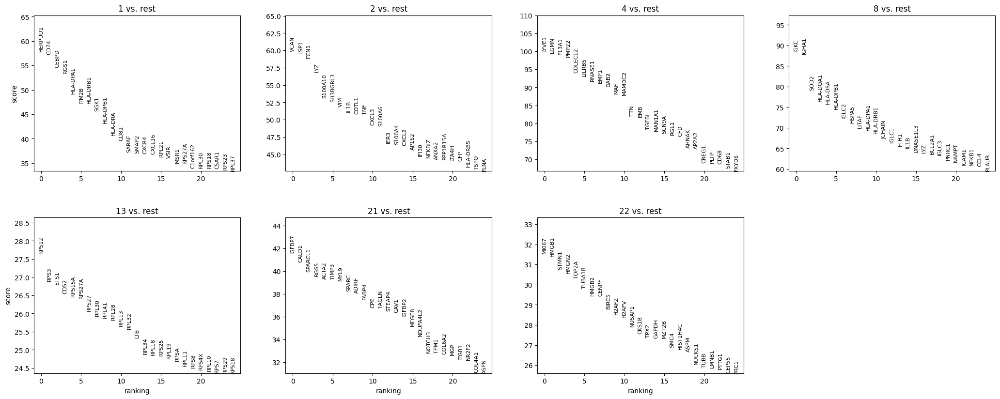

In [119]:
sc.tl.rank_genes_groups(macrophages_adata_filtered_medium, 'leiden_0.6', method='wilcoxon', key_added='m_rank_leiden_0.6')
sc.pl.rank_genes_groups(macrophages_adata_filtered_medium, n_genes=25, sharey=False, key='m_rank_leiden_0.6')

In [122]:
df_ranked_genes = sc.get.rank_genes_groups_df(macrophages_adata_filtered_medium, '8', key='m_rank_leiden_0.6')
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,IGKC,88.623756,6.272355,0.0,0.0
1,IGHA1,87.932228,6.484612,0.0,0.0
2,SOD2,79.163307,3.762065,0.0,0.0
3,HLA-DQA1,76.461754,2.944593,0.0,0.0
4,HLA-DRA,75.875015,2.051161,0.0,0.0
...,...,...,...,...,...
36596,MAF,-73.553398,-3.471397,0.0,0.0
36597,RBPJ,-73.560852,-2.660868,0.0,0.0
36598,RNASE1,-76.100952,-4.052781,0.0,0.0
36599,TXNIP,-77.087181,-3.825500,0.0,0.0


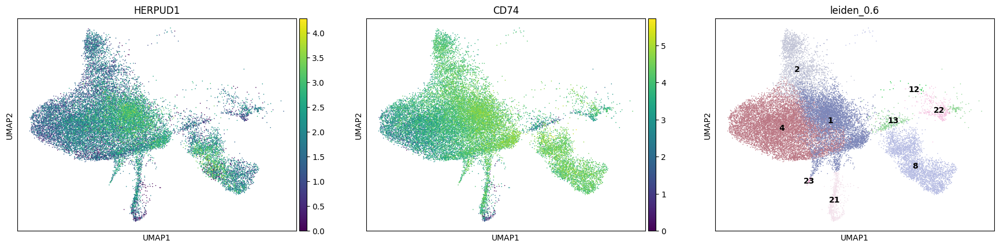

In [126]:
sc.pl.umap(macrophages_adata_filtered_small, color=['HERPUD1', 'CD74', 'leiden_0.6'], legend_loc='on data')

ranking genes
    finished: added to `.uns['m_rank_leiden_1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:31)


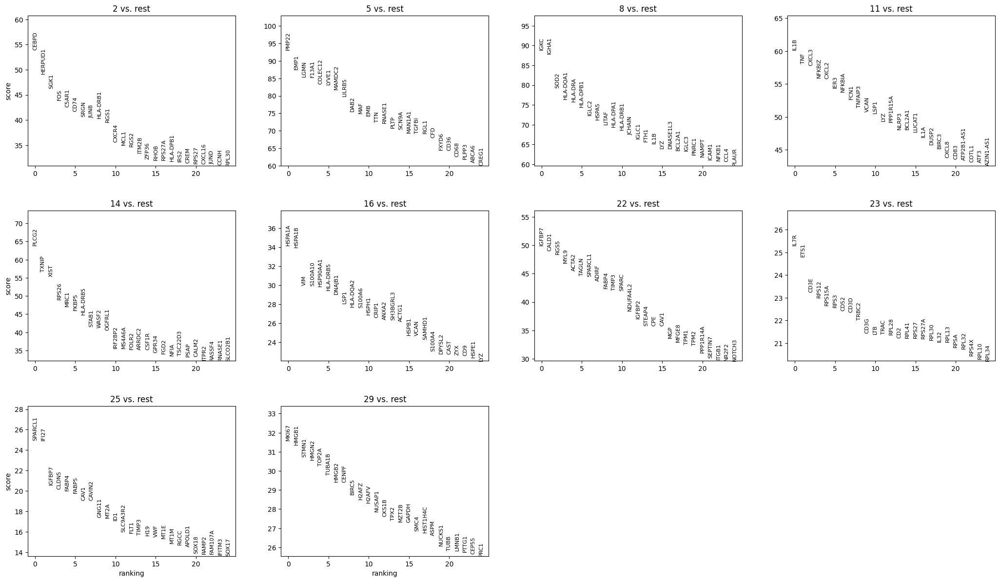

In [127]:
sc.tl.rank_genes_groups(macrophages_adata_filtered_large, 'leiden_1', method='wilcoxon', key_added='m_rank_leiden_1')
sc.pl.rank_genes_groups(macrophages_adata_filtered_large, n_genes=25, sharey=False, key='m_rank_leiden_1')

In [137]:
df_ranked_genes = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '5', key='m_rank_leiden_1')
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,PMP22,93.062050,2.730805,0.0,0.0
1,EMP1,87.544998,2.959708,0.0,0.0
2,LGMN,85.384605,2.223809,0.0,0.0
3,F13A1,85.286865,2.089661,0.0,0.0
4,COLEC12,83.360298,2.364133,0.0,0.0
...,...,...,...,...,...
36596,HLA-DQA1,-82.393753,-2.916390,0.0,0.0
36597,HLA-DRB1,-87.013664,-2.004696,0.0,0.0
36598,HLA-DPB1,-89.787544,-2.310260,0.0,0.0
36599,HLA-DRA,-90.414825,-2.083463,0.0,0.0


In [144]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '5', key='m_rank_leiden_1', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:BP,GO:0032502,developmental process,0.000005,True,"""A biological process whose specific outcome i...",6414,86,53,21010,0.616279,0.008263,query_1,[GO:0008150]
1,GO:CC,GO:0005576,extracellular region,0.000016,True,"""The space external to the outermost structure...",4206,88,39,22090,0.443182,0.009272,query_1,[GO:0110165]
2,GO:BP,GO:0048856,anatomical structure development,0.000031,True,"""The biological process whose specific outcome...",5862,86,49,21010,0.569767,0.008359,query_1,[GO:0032502]
3,GO:BP,GO:0048731,system development,0.000126,True,"""The process whose specific outcome is the pro...",3951,86,38,21010,0.441860,0.009618,query_1,"[GO:0007275, GO:0048856]"
4,GO:BP,GO:0007275,multicellular organism development,0.000247,True,"""The biological process whose specific outcome...",4610,86,41,21010,0.476744,0.008894,query_1,"[GO:0032501, GO:0048856]"
5,GO:CC,GO:0005615,extracellular space,0.000548,True,"""That part of a multicellular organism outside...",3284,88,31,22090,0.352273,0.009440,query_1,"[GO:0005576, GO:0110165]"
6,GO:BP,GO:0016477,cell migration,0.000775,True,"""The controlled self-propelled movement of a c...",1475,86,21,21010,0.244186,0.014237,query_1,[GO:0048870]
7,GO:MF,GO:0008009,chemokine activity,0.001024,True,"""The function of a family of small chemotactic...",50,85,5,20139,0.058824,0.100000,query_1,"[GO:0005125, GO:0042379]"
8,GO:CC,GO:0031982,vesicle,0.003808,True,"""Any small, fluid-filled, spherical organelle ...",3976,88,33,22090,0.375000,0.008300,query_1,[GO:0043227]
9,GO:BP,GO:0048704,embryonic skeletal system morphogenesis,0.004912,True,"""The process in which the anatomical structure...",93,86,6,21010,0.069767,0.064516,query_1,"[GO:0048562, GO:0048705, GO:0048706]"


In [138]:
df_ranked_genes = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '2', key='m_rank_leiden_1')
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,CEBPD,53.862118,0.934199,0.000000e+00,0.000000e+00
1,HERPUD1,49.197319,1.046546,0.000000e+00,0.000000e+00
2,SGK1,46.279114,1.496445,0.000000e+00,0.000000e+00
3,FOS,43.938419,1.281860,0.000000e+00,0.000000e+00
4,C5AR1,42.612175,0.950676,0.000000e+00,0.000000e+00
...,...,...,...,...,...
36596,HSPA1A,-36.628109,-1.538806,1.021123e-293,2.491608e-290
36597,ACP5,-37.477108,-1.765555,2.174173e-307,5.684064e-304
36598,HSP90AA1,-37.819675,-0.853487,0.000000e+00,0.000000e+00
36599,TNFAIP2,-39.522041,-1.271631,0.000000e+00,0.000000e+00


In [155]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '2', key='m_rank_leiden_1', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,GO:CC,GO:0072562,blood microparticle,0.030846,True,"""A phospholipid microvesicle that is derived f...",136,4,2,22090,0.50,0.014706,query_1,"[GO:0005615, GO:0110165]"
1,GO:MF,GO:0031714,C5a anaphylatoxin chemotactic receptor binding,0.049904,True,"""Binding to a C5a anaphylatoxin chemotactic re...",1,4,1,20139,0.25,1.000000,query_1,[GO:0001664]
2,GO:MF,GO:0031715,C5L2 anaphylatoxin chemotactic receptor binding,0.049904,True,"""Binding to a C5L2 anaphylatoxin chemotactic r...",1,4,1,20139,0.25,1.000000,query_1,[GO:0031714]


In [140]:
df_ranked_genes = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '14', key='m_rank_leiden_1')
df_ranked_genes

,names,scores,logfoldchanges,pvals,pvals_adj
0,PLCG2,63.919239,2.581263,0.0,0.0
1,TXNIP,56.691063,1.792713,0.0,0.0
2,XIST,55.318501,2.727509,0.0,0.0
3,RPS26,48.982418,1.413931,0.0,0.0
4,MRC1,47.152184,1.145443,0.0,0.0
...,...,...,...,...,...
36596,NAMPT,-62.598915,-3.438004,0.0,0.0
36597,NR4A2,-63.789314,-4.477297,0.0,0.0
36598,EGR1,-65.471588,-4.596129,0.0,0.0
36599,JUNB,-65.895393,-2.832144,0.0,0.0


In [154]:
df_rank_cur_cluster = sc.get.rank_genes_groups_df(macrophages_adata_filtered_large, '14', key='m_rank_leiden_1', 
                                                  log2fc_min=2, pval_cutoff=0.05)
sel_genes = [ gene for gene in df_rank_cur_cluster.dropna()['names'] ]
sc.queries.enrich( sel_genes, org='hsapiens').head(n=10)

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents
0,REAC,REAC:R-HSA-202433,Generation of second messenger molecules,0.005478,True,Generation of second messenger molecules,35,3,2,10835,0.666667,0.057143,query_1,[REAC:R-HSA-202403]
1,GO:MF,GO:0008081,phosphoric diester hydrolase activity,0.049131,True,"""Catalysis of the hydrolysis of a phosphodiest...",90,6,2,20139,0.333333,0.022222,query_1,[GO:0042578]


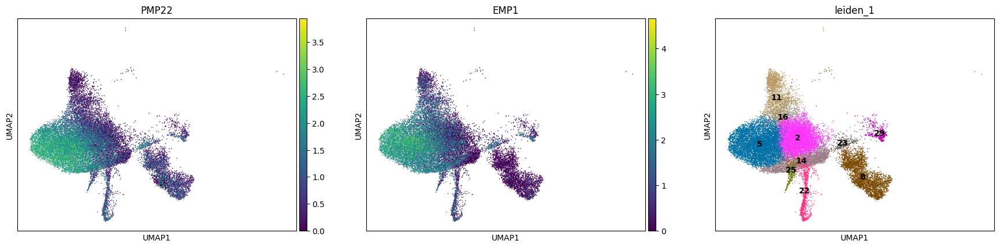

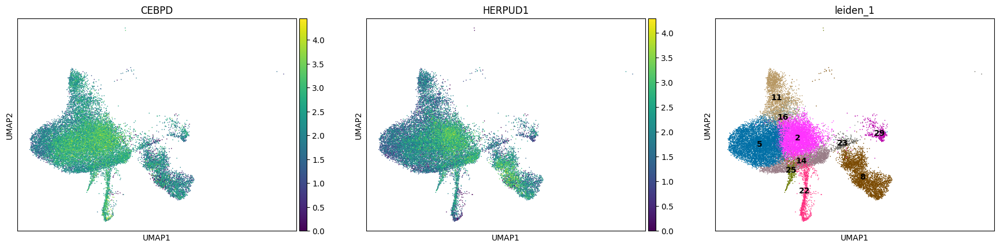

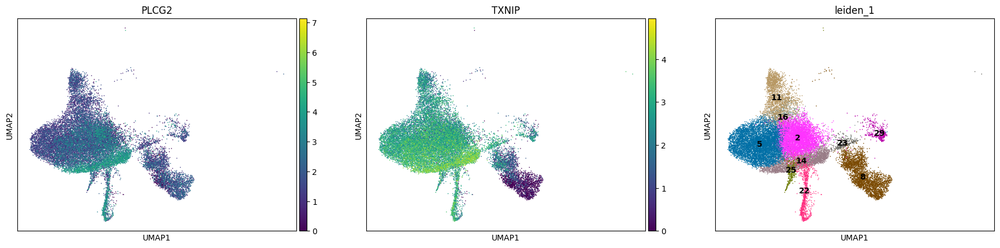

In [142]:
sc.pl.umap(macrophages_adata_filtered_large, color=['PMP22', 'EMP1', 'leiden_1'], legend_loc='on data')
sc.pl.umap(macrophages_adata_filtered_large, color=['CEBPD', 'HERPUD1', 'leiden_1'], legend_loc='on data')
sc.pl.umap(macrophages_adata_filtered_large, color=['PLCG2', 'TXNIP', 'leiden_1'], legend_loc='on data')

### Annotating celltypes Using ScArches

In [3]:
adata=anndata.read("/media/gambino/students_workdir/ibp/combined_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_2_12.h5")
adata_to_map = adata.copy()
for layer in list(adata_to_map.layers.keys()):
    if layer != "raw_counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["raw_counts"]

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [4]:
reference_model_features = pd.read_csv(
    "/media/gambino/students_workdir/ibp/CO_IMM.scp.features.tsv", index_col=0,
    header=None,
    names=["gene_ids","gene_names"],
    delimiter="\t")
print("Total number of genes needed for mapping:", reference_model_features.shape[0])
adata_to_map.var["gene_names"] = adata_to_map.var.index
adata_to_map.var.set_index("gene_ids", inplace=True)
if "PCs" in adata_to_map.varm.keys():
    del adata_to_map.varm["PCs"]
print(
    "Number of genes found in query dataset:",
    adata_to_map.var.index.isin(reference_model_features.index).sum(),
)

Total number of genes needed for mapping: 28663
Number of genes found in query dataset: 26940


In [5]:
from scipy.sparse import csr_matrix
missing_genes = [
    gene_id
    for gene_id in reference_model_features.index
    if gene_id not in adata_to_map.var.index
]
missing_gene_adata = sc.AnnData(
    X=csr_matrix(np.zeros(shape=(adata.n_obs, len(missing_genes))), dtype="float32"),
    obs=adata.obs.iloc[:, :1],
    var=reference_model_features.loc[missing_genes, :],
)
missing_gene_adata.layers["raw_counts"] = missing_gene_adata.X

    
adata_to_map_augmented = sc.concat(
    [adata_to_map, missing_gene_adata],
    axis=1,
    join="outer",
    index_unique=None,
    merge="unique",
)
adata_to_map_augmented = adata_to_map_augmented[
    :, reference_model_features.index
].copy()
(adata_to_map_augmented.var.index == reference_model_features.index).all()

True

In [6]:
adata_to_map_augmented.var["gene_ids"] = adata_to_map_augmented.var.index
adata_to_map_augmented.var.set_index("gene_names", inplace=True)

In [7]:
adata_to_map_augmented.obs.batch.unique()

['GC1004281_E2', 'GC1004282_F2', 'GC1004283_G2', 'GC1004284_F4', 'GC1004285_G4', ..., 'GC115857_SI-GA-F3', 'GC115858_SI-GA-G3', 'GC115989_SI-GA-H3', 'GC115990_SI-GA-A4', 'GC115991_SI-GA-B4']
Length: 27
Categories (27, object): ['GC108651_SI-GA-C3', 'GC108652_SI-GA-D3', 'GC108653_SI-GA-E3', 'GC110299_SI-GA-E8', ..., 'GC1004283_G2', 'GC1004284_F4', 'GC1004285_G4', 'GC1004286_H4']

In [8]:
immune_ref_adata = sc.read_mtx("/media/gambino/students_workdir/ibp/CO_IMM.scp.raw.mtx")
immune_ref_adata=immune_ref_adata.T
immune_ref_adata.layers["raw_counts"]=immune_ref_adata.X
df=pd.read_csv("/media/gambino/students_workdir/ibp/scp_metadata_combined.v2.txt",delimiter="\t",skiprows=[1])
barcodes = pd.read_csv(
    "/media/gambino/students_workdir/ibp/CO_IMM.scp.barcodes.tsv",
    header=None,names=["barcodes"])

/tmp/ipykernel_1784125/396378398.py:4: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("/media/gambino/students_workdir/ibp/scp_metadata_combined.v2.txt",delimiter="\t",skiprows=[1])


In [9]:
immune_ref_adata.var_names = reference_model_features["gene_names"]
immune_ref_adata.obs_names = barcodes["barcodes"]
immune_ref_adata.obs=immune_ref_adata.obs.join(df.set_index("NAME")["Celltype"],how="inner")
immune_ref_adata.obs=immune_ref_adata.obs.join(df.set_index("NAME")["library_preparation_protocol"],how="inner")
scvi.model.SCVI.setup_anndata(immune_ref_adata, batch_key="library_preparation_protocol", layer="raw_counts")

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/abc.py:98: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scvi/data/fields/_layer_field.py:101: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  _verify_and_correct_data_format(adata, self.attr_name, self.attr_key)


In [14]:
scvi_ref = scvi.model.SCVI(
    immune_ref_adata,
    use_layer_norm="both",
    use_batch_norm="none",
    encode_covariates=True,
    dropout_rate=0.2,
    n_layers=2,
)
scvi_ref.train(batch_size=5000)
scvi_ref.save('/media/gambino/students_workdir/ibp/scvi_ref_trained_model', overwrite=True)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:31)
running Leiden clustering
    finished: found 30 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:43)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:58)


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desire

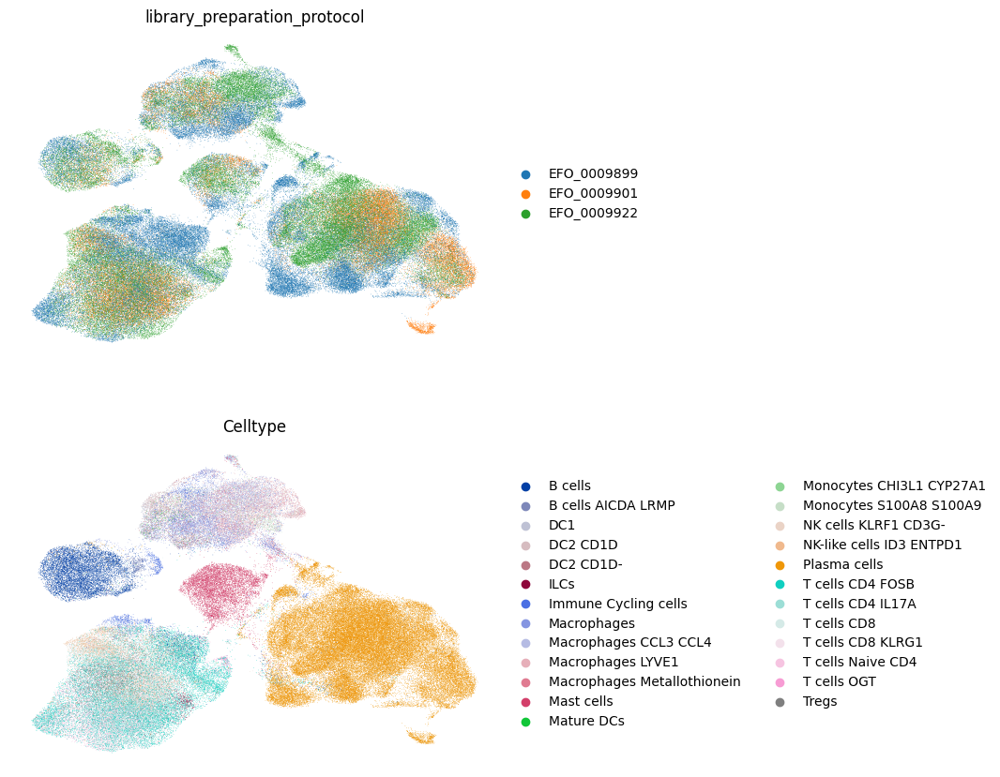

In [15]:
SCVI_LATENT_KEY = "X_scVI"
immune_ref_adata.obsm[SCVI_LATENT_KEY] = scvi_ref.get_latent_representation()
sc.pp.neighbors(immune_ref_adata, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(immune_ref_adata)
sc.tl.umap(immune_ref_adata)
sc.pl.umap(
    immune_ref_adata,
    color=["library_preparation_protocol", "Celltype"],
    frameon=False,
    ncols=1,
)

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


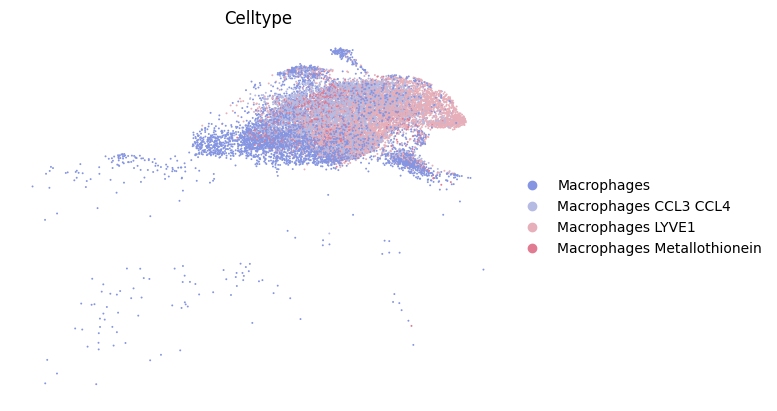

In [31]:
sc.pl.umap(
    immune_ref_adata[immune_ref_adata.obs['Celltype'].apply(lambda x:"Macrophages" in x )],
    color=["Celltype"],
    frameon=False,
    ncols=1,
)

In [16]:
immune_ref_adata.write("/media/gambino/students_workdir/ibp/umap_xscvi_clustered_immune_ref.h5")

In [36]:
adata_to_map_augmented.obs["library_preparation_protocol"]="EFO_0009922"

In [37]:
scarches_model = scvi.model.SCVI.load_query_data(
    adata=adata_to_map_augmented,
    reference_model="/media/gambino/students_workdir/ibp/scvi_ref_trained_model",
    freeze_dropout=True,
)

INFO     File /media/gambino/students_workdir/ibp/scvi_ref_trained_model/model.pt already downloaded               


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scvi/model/base/_archesmixin.py:96: UserWarning: var_names for adata passed in does not match var_names of adata used to train the model. For valid results, the vars need to be the same and in the same order as the adata used to train the model.
  _validate_var_names(adata, var_names)


In [39]:
scarches_model.train(max_epochs=50, batch_size=5000,plan_kwargs=dict(weight_decay=0.0))
scarches_model.save('/media/gambino/students_workdir/ibp/scvi_ref_finetuned_model', overwrite=True)

In [40]:
adata.obsm["X_scVI"] = scarches_model.get_latent_representation()
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:13)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:48)


In [43]:
immune_ref_adata.obs["reference_or_query"] = "reference"
immune_ref_adata_emb = sc.AnnData(X=immune_ref_adata.obsm["X_scVI"], obs=immune_ref_adata.obs)
adata_emb = sc.AnnData(X=adata.obsm["X_scVI"], obs=adata.obs)
adata_emb.obs["reference_or_query"] = "query"
emb_ref_query = sc.concat(
    [immune_ref_adata_emb, adata_emb],
    axis=0,
    join="outer",
    index_unique=None,
    merge="unique",
)
sc.pp.neighbors(emb_ref_query)
sc.tl.umap(emb_ref_query)

computing neighbors
    using data matrix X directly


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:29)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:01)


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


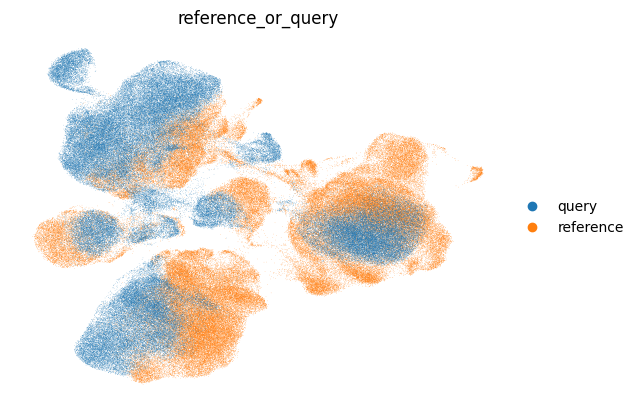

In [44]:
sc.pl.umap(
    emb_ref_query,
    color=["reference_or_query"],
    sort_order=False,
    frameon=False,
)

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


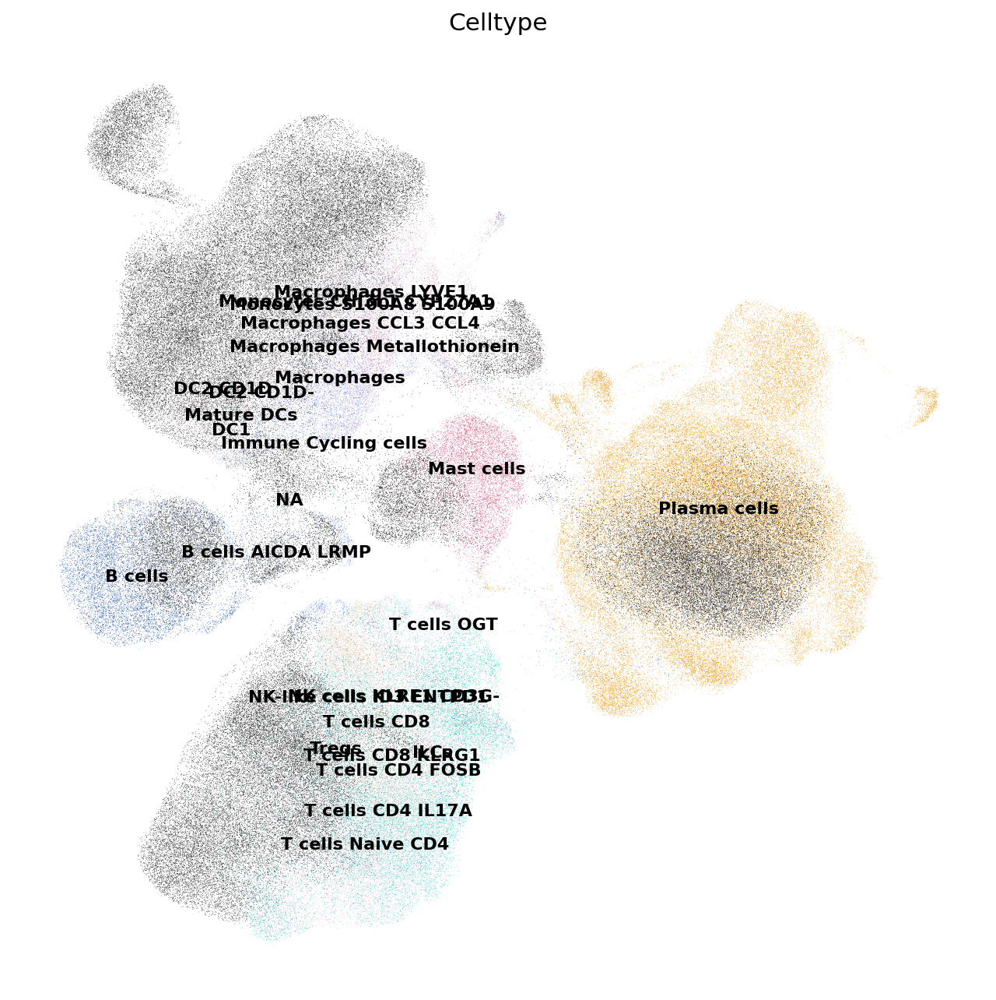

In [46]:
sc.set_figure_params(figsize=(10, 10))
sc.pl.umap(
    emb_ref_query,
    color=["Celltype"],
    sort_order=False,
    frameon=False,
    legend_loc="on data",
    legend_fontsize=10,
    na_color="black",
)

In [51]:
import scarches as sca
knn_transformer = sca.utils.knn.weighted_knn_trainer(
    train_adata=immune_ref_adata_emb,
    train_adata_emb="X",  # location of our joint embedding
    n_neighbors=15,
)
labels, uncert = sca.utils.knn.weighted_knn_transfer(
    query_adata=adata_emb,
    query_adata_emb="X",  # location of our embedding, query_adata.X in this case
    label_keys="Celltype",  # (start of) obs column name(s) for which to transfer labels
    knn_model=knn_transformer,
    ref_adata_obs=immune_ref_adata_emb.obs,
)
adata_emb.obs["transf_cell_type"] = labels.loc[adata_emb.obs.index, "Celltype"]
adata_emb.obs["transf_cell_type_unc"] = uncert.loc[adata_emb.obs.index, "Celltype"]
adata.obs.loc[adata_emb.obs.index, "transf_cell_type"] = adata_emb.obs[
    "transf_cell_type"
]
adata.obs.loc[adata_emb.obs.index, "transf_cell_type_unc"] = adata_emb.obs[
    "transf_cell_type_unc"
]

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


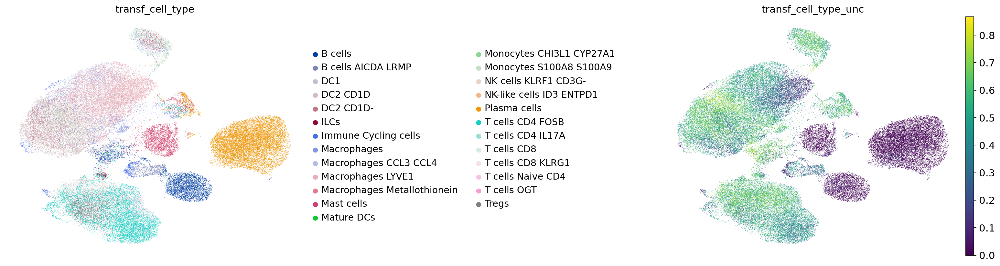

In [56]:
sc.set_figure_params(figsize=(6, 6))
sc.pl.umap(adata, color=["transf_cell_type","transf_cell_type_unc"], frameon=False,wspace=1)

/tmp/ipykernel_1784125/207161012.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby("transf_cell_type")
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(

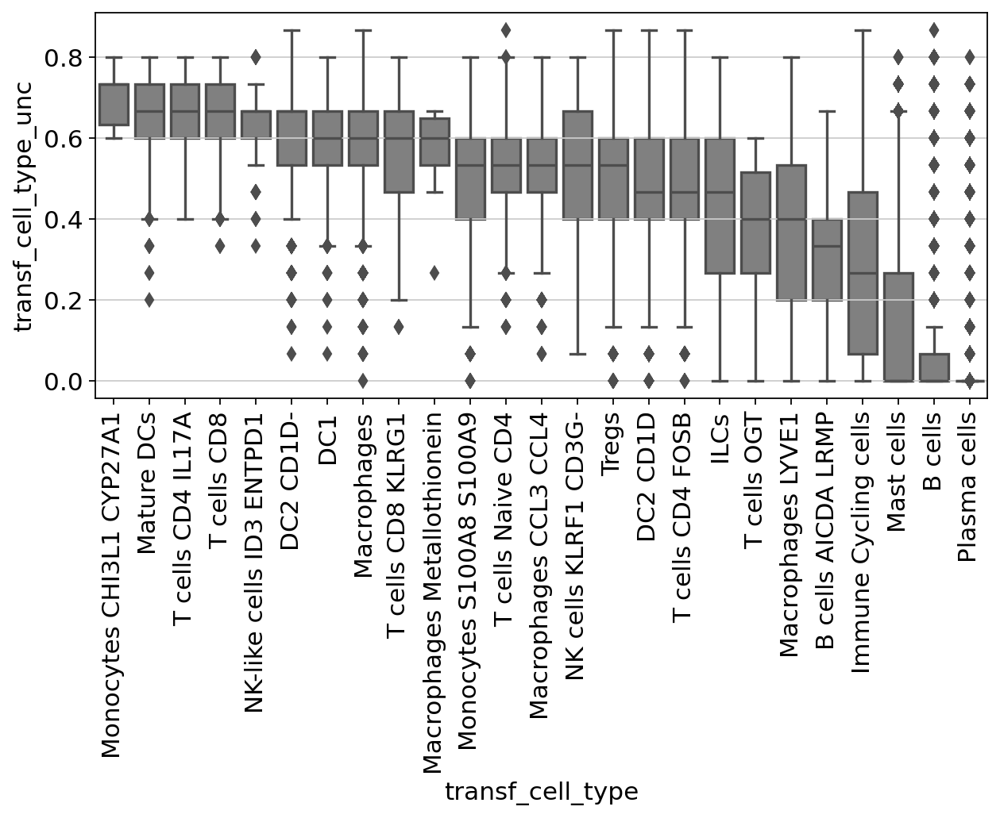

In [59]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(9, 4))
ct_order = (
    adata.obs.groupby("transf_cell_type")
    .agg({"transf_cell_type_unc": "median"})
    .sort_values(by="transf_cell_type_unc", ascending=False)
)
sns.boxplot(
    adata.obs,
    x="transf_cell_type",
    y="transf_cell_type_unc",
    color="grey",
    ax=ax,
    order=ct_order.index,
)
ax.tick_params(rotation=90, axis="x")

/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/media/gambino/students_workdir/anis/miniconda3/envs/ibp-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


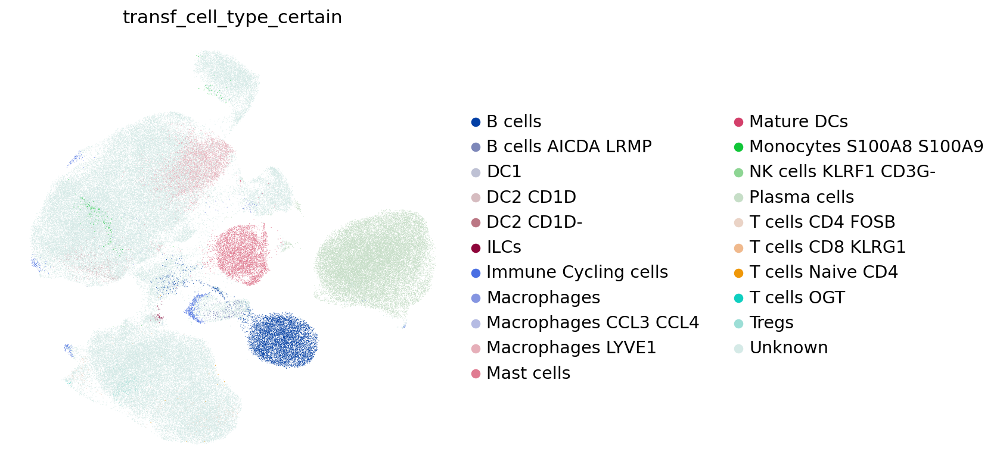

In [64]:
adata.obs["transf_cell_type_certain"] = adata.obs.transf_cell_type.tolist()
adata.obs.loc[
    adata.obs.transf_cell_type_unc > 0.2, "transf_cell_type_certain"
] = "Unknown"
sc.pl.umap(adata, color="transf_cell_type_certain", frameon=False)

In [72]:
adata.obs.transf_cell_type.value_counts()

transf_cell_type
Plasma cells                   26086
Macrophages LYVE1              20150
T cells CD4 FOSB               16961
DC2 CD1D                       12929
B cells                         8101
Mast cells                      6468
Monocytes S100A8 S100A9         6250
Macrophages                     4923
Tregs                           4326
Macrophages CCL3 CCL4           3799
DC2 CD1D-                       3612
T cells CD8 KLRG1               3435
T cells Naive CD4               2854
Immune Cycling cells            1554
B cells AICDA LRMP              1169
DC1                              864
T cells CD8                      590
ILCs                             349
NK-like cells ID3 ENTPD1         251
Mature DCs                       242
NK cells KLRF1 CD3G-             181
T cells CD4 IL17A                153
T cells OGT                       58
Monocytes CHI3L1 CYP27A1          11
Macrophages Metallothionein       10
Name: count, dtype: int64

In [71]:
uns_1=adata.obs["transf_cell_type_unc"]
adata.obs['transf_cell_type_unc']= {key: str(value) for key, value in uns_1.items()}
adata.write("/media/gambino/students_workdir/ibp/combined_immunerefannotated_markergenes_nodoublets_clustered_normalizedpersampleglobal_qced_filtered_counts_5_12.h5")